# **INFERENCING**

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

## **MODEL 1 : FASTER R-CNN ResNet 101 V1 1024x1024**

# Step 1: Supressing TensorFlow logging and enabling GPU dynamic memory allocation

## This step is used to prevent TensorFlow from displaying unnecessary information on the console.
## This step is used to allow the GPU to allocate memory dynamically as needed during the inference process.

In [12]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2' #supress TF logging 1
import pathlib
import tensorflow as tf
tf.get_logger().setLevel('ERROR') #supress TF logging 2
# Enable GPU dynamic memory allocation
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
IMAGE_PATHS = 'test_images/'

# Step 2 : Setting paths for model, image and label map

##  This step is used to specify the path to the model, images and label map that will be used for inference.

In [13]:
#Model path
PATH_TO_MODEL = "faster_rcnn_resnet101_v1_1024x1024_coco17_tpu-8"


In [14]:
PATH_TO_MODEL_DIR = './training/TF2/training/{}/saved_model/saved_model/'.format(PATH_TO_MODEL)

In [15]:
print(PATH_TO_MODEL_DIR)

./training/TF2/training/faster_rcnn_resnet101_v1_1024x1024_coco17_tpu-8/saved_model/saved_model/


In [16]:
PATH_TO_LABELS = './data/label_map.pbtxt'

# Step 3 : Loading the model and creating the detection function: 

## This step loads the saved model and creates a detection function using the tf.saved_model.load() function.

In [17]:
import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
PATH_TO_SAVED_MODEL = PATH_TO_MODEL_DIR
print('Loading model...', end='')
start_time = time.time()
# Load saved model and build the detection function
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)
end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

Loading model...Done! Took 6.939817428588867 seconds


# Step 4 : Creating the category index

## This step loads the label map and creates a category index to map class IDs to class names.

In [18]:
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

# Step 5 : Running inference on test images 

## This step runs inference on each image in the specified directory, using the detection function. The outputs of the detection function are in the form of a dictionary containing detection boxes, scores, and classes. And finaly visualize the results using the visualization_utils module.

Running inference for test_images/g00021.jpg... Done
Running inference for test_images/Pica_pica_-Helsinki,_Finland-8a.jpg... Done
Running inference for test_images/robin_adult_1200x675.jpg... Done
Running inference for test_images/pexels-photo-6771894.jpeg... Done
Running inference for test_images/1016110_robin.jpg... Done
Running inference for test_images/focused_467049850-stock-photo-scotland-coal-tit-periparus-ater.jpg... Done
Running inference for test_images/G4M2-website-robin-2_LR_80ad003c4c6aabee89255151518bb9f9.jpg... Done
Running inference for test_images/file.jpg... Done
Running inference for test_images/1-42.jpg... Done
Running inference for test_images/animal-bird-coal-tit-young.jpg... Done
Running inference for test_images/pexels-petr-ganaj-4168320.jpg... Done
Running inference for test_images/pexels-photo-9249977.jpeg... Done
Running inference for test_images/5a7a88ca4f15a833b877510edfcd0fff.jpg... Done
Running inference for test_images/1000_F_307099660_5R8rStzeL3cvnXSxp

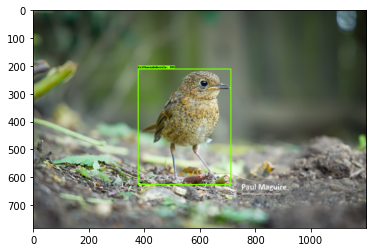

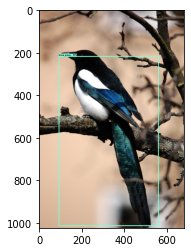

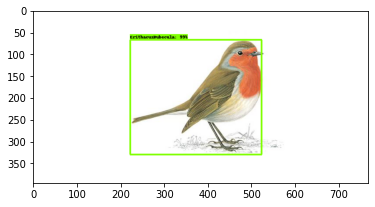

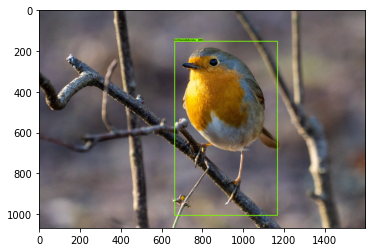

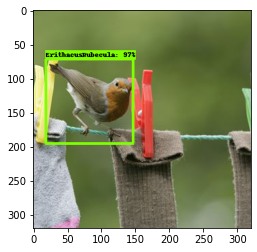

...

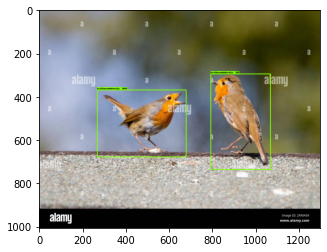

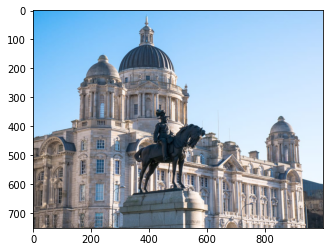

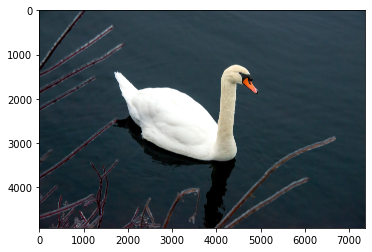

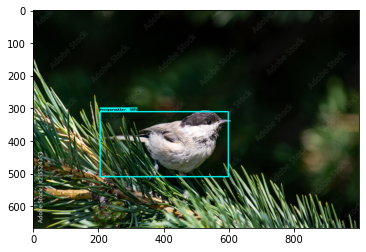

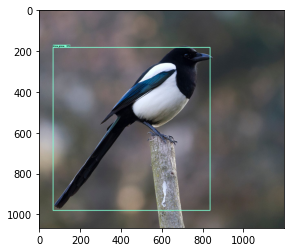

In [35]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
import os
warnings.filterwarnings('ignore')
# Suppress Matplotlib warnings
def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.
    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.
    Args:
    path: the file path to the image
    Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))

for image_path in os.listdir(IMAGE_PATHS):
    image_path = os.path.join(IMAGE_PATHS, image_path)
    print('Running inference for {}... '.format(image_path), end='')
    image_np = load_image_into_numpy_array(image_path)
    # Things to try:
    # Flip horizontally
    # image_np = np.fliplr(image_np).copy()
    # Convert image to grayscale
    # image_np = np.tile()
    # np.mean(image_np, 2, keepdims=True), (1, 1, 3).astype(np.uint8)
        # The input needs to be a tensor, convert it using `tf.convert_to_tensor`
    input_tensor = tf.convert_to_tensor(image_np)
        # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis, ...]
        # input_tensor = np.expand_dims(image_np, 0)
    detections = detect_fn(input_tensor)
        # All outputs are batches tensors.
        # Convert to numpy arrays, and take index [0] to remove the batch dimensi
        # We're only interested in the first num_detections.
    num_detections = int(detections.pop('num_detections'))
    detections = {key: value[0, :num_detections].numpy()
                    for key, value in detections.items()}
    detections['num_detections'] = num_detections
        # detection_classes should be ints./

    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)
    image_np_with_detections = image_np.copy()
    viz_utils.visualize_boxes_and_labels_on_image_array(
        image_np_with_detections,
        detections['detection_boxes'],
        detections['detection_classes'],
        detections['detection_scores'],
        category_index,
        use_normalized_coordinates=True,
        max_boxes_to_draw=200,
        min_score_thresh=0.95,
        agnostic_mode=False)
    plt.figure()
    plt.imshow(image_np_with_detections)
    print('Done')
plt.show()
# sphinx_gallery_thumbnail_number = 2


## **MODEL 2 : SSD ResNet 50 V1 1024x1024**

In [21]:
import matplotlib.pyplot as plt
%matplotlib inline
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2' #supress TF logging 1
import pathlib
import tensorflow as tf
tf.get_logger().setLevel('ERROR') #supress TF logging 2
# Enable GPU dynamic memory allocation
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
IMAGE_PATHS = 'test_images/'


In [22]:
#Model path
PATH_TO_MODEL = "ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8"

In [23]:
PATH_TO_MODEL_DIR = './training/TF2/training/{}/saved_model/saved_model/'.format(PATH_TO_MODEL)

In [24]:
print(PATH_TO_MODEL_DIR)

./training/TF2/training/ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8/saved_model/saved_model/


In [25]:
PATH_TO_LABELS = './data/label_map.pbtxt'

In [26]:
import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
PATH_TO_SAVED_MODEL = PATH_TO_MODEL_DIR
print('Loading model...', end='')
start_time = time.time()
# Load saved model and build the detection function
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)
end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

Loading model...Done! Took 6.30220890045166 seconds


In [27]:
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

Running inference for test_images/g00021.jpg... Done
Running inference for test_images/Pica_pica_-Helsinki,_Finland-8a.jpg... Done
Running inference for test_images/robin_adult_1200x675.jpg... Done
Running inference for test_images/pexels-photo-6771894.jpeg... Done
Running inference for test_images/1016110_robin.jpg... Done
Running inference for test_images/focused_467049850-stock-photo-scotland-coal-tit-periparus-ater.jpg... Done
Running inference for test_images/G4M2-website-robin-2_LR_80ad003c4c6aabee89255151518bb9f9.jpg... Done
Running inference for test_images/file.jpg... Done
Running inference for test_images/1-42.jpg... Done
Running inference for test_images/animal-bird-coal-tit-young.jpg... Done
Running inference for test_images/pexels-petr-ganaj-4168320.jpg... Done
Running inference for test_images/pexels-photo-9249977.jpeg... Done
Running inference for test_images/5a7a88ca4f15a833b877510edfcd0fff.jpg... Done
Running inference for test_images/1000_F_307099660_5R8rStzeL3cvnXSxp

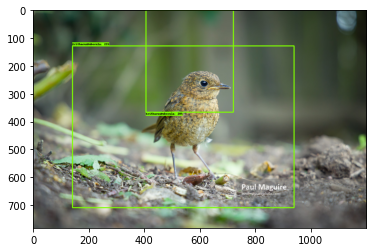

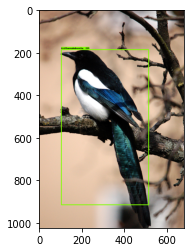

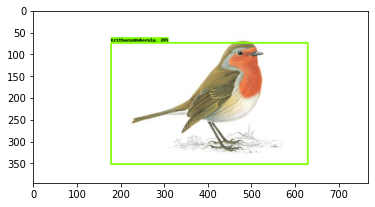

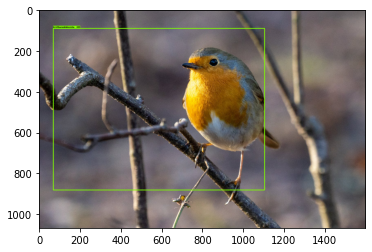

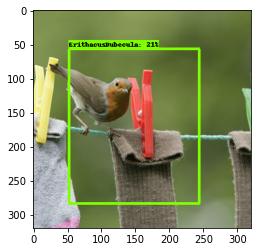

...

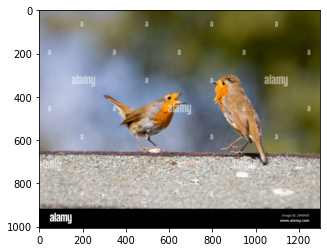

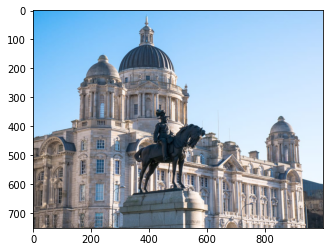

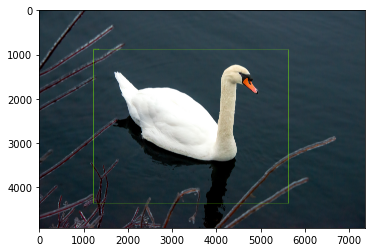

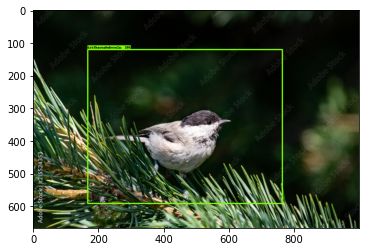

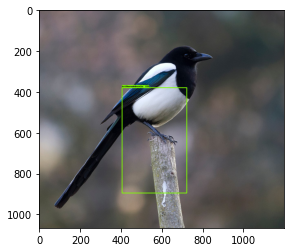

In [34]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
import os
warnings.filterwarnings('ignore')
# Suppress Matplotlib warnings
def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.
    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.
    Args:
    path: the file path to the image
    Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))

for image_path in os.listdir(IMAGE_PATHS):
    image_path = os.path.join(IMAGE_PATHS, image_path)
    print('Running inference for {}... '.format(image_path), end='')
    image_np = load_image_into_numpy_array(image_path)
    # Things to try:
    # Flip horizontally
    # image_np = np.fliplr(image_np).copy()
    # Convert image to grayscale
    # image_np = np.tile()
    # np.mean(image_np, 2, keepdims=True), (1, 1, 3).astype(np.uint8)
        # The input needs to be a tensor, convert it using `tf.convert_to_tensor`
    input_tensor = tf.convert_to_tensor(image_np)
        # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis, ...]
        # input_tensor = np.expand_dims(image_np, 0)
    detections = detect_fn(input_tensor)
        # All outputs are batches tensors.
        # Convert to numpy arrays, and take index [0] to remove the batch dimensi
        # We're only interested in the first num_detections.
    num_detections = int(detections.pop('num_detections'))
    detections = {key: value[0, :num_detections].numpy()
                    for key, value in detections.items()}
    detections['num_detections'] = num_detections
        # detection_classes should be ints./

    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)
    image_np_with_detections = image_np.copy()
    viz_utils.visualize_boxes_and_labels_on_image_array(
        image_np_with_detections,
        detections['detection_boxes'],
        detections['detection_classes'],
        detections['detection_scores'],
        category_index,
        use_normalized_coordinates=True,
        max_boxes_to_draw=200,
        min_score_thresh=0.2,
        agnostic_mode=False)
    plt.figure()
    plt.imshow(image_np_with_detections)
    print('Done')
plt.show()
# sphinx_gallery_thumbnail_number = 2


## **MODEL 3 : SSD MobileNet V2 640x640**

In [9]:
import matplotlib.pyplot as plt
%matplotlib inline
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2' #supress TF logging 1
import pathlib
import tensorflow as tf
tf.get_logger().setLevel('ERROR') #supress TF logging 2
# Enable GPU dynamic memory allocation
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
IMAGE_PATHS = 'test_images/'

In [10]:
#Model path
PATH_TO_MODEL = "ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8"

In [11]:
PATH_TO_MODEL_DIR = './training/TF2/training/{}/saved_model/saved_model/'.format(PATH_TO_MODEL)

In [12]:
print(PATH_TO_MODEL_DIR)

./training/TF2/training/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/saved_model/saved_model/


In [13]:
PATH_TO_LABELS = './data/label_map.pbtxt'

In [14]:
import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
PATH_TO_SAVED_MODEL = PATH_TO_MODEL_DIR
print('Loading model...', end='')
start_time = time.time()
# Load saved model and build the detection function
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)
end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

Loading model...Done! Took 5.909706115722656 seconds


In [15]:
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

Running inference for test_images/g00021.jpg... Done
Running inference for test_images/Pica_pica_-Helsinki,_Finland-8a.jpg... Done
Running inference for test_images/robin_adult_1200x675.jpg... Done
Running inference for test_images/pexels-photo-6771894.jpeg... Done
Running inference for test_images/1016110_robin.jpg... Done
Running inference for test_images/focused_467049850-stock-photo-scotland-coal-tit-periparus-ater.jpg... Done
Running inference for test_images/G4M2-website-robin-2_LR_80ad003c4c6aabee89255151518bb9f9.jpg... Done
Running inference for test_images/file.jpg... Done
Running inference for test_images/1-42.jpg... Done
Running inference for test_images/animal-bird-coal-tit-young.jpg... Done
Running inference for test_images/pexels-petr-ganaj-4168320.jpg... Done
Running inference for test_images/pexels-photo-9249977.jpeg... Done
Running inference for test_images/5a7a88ca4f15a833b877510edfcd0fff.jpg... Done
Running inference for test_images/1000_F_307099660_5R8rStzeL3cvnXSxp

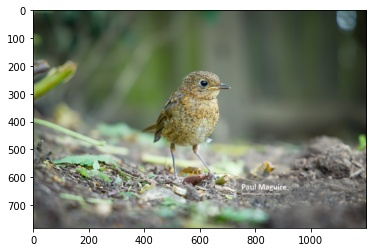

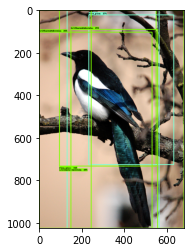

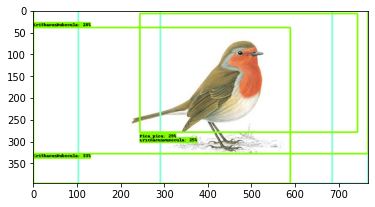

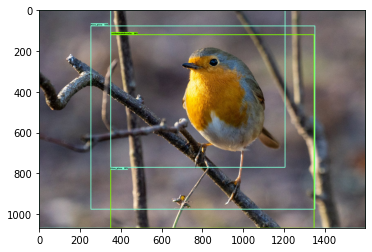

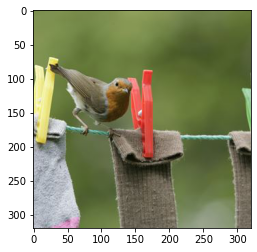

...

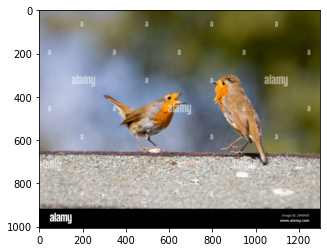

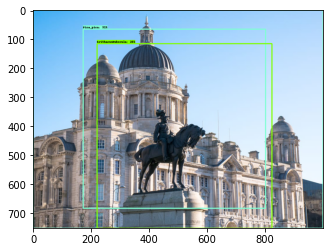

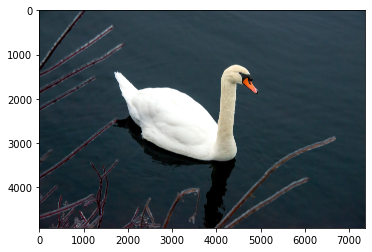

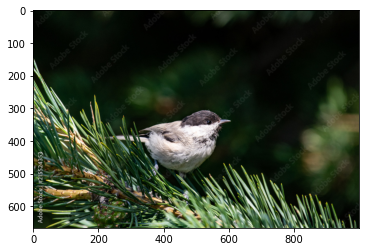

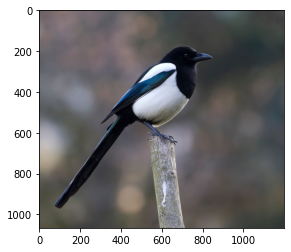

In [20]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
import os
warnings.filterwarnings('ignore')
# Suppress Matplotlib warnings
def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.
    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.
    Args:
    path: the file path to the image
    Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))

for image_path in os.listdir(IMAGE_PATHS):
    image_path = os.path.join(IMAGE_PATHS, image_path)
    print('Running inference for {}... '.format(image_path), end='')
    image_np = load_image_into_numpy_array(image_path)
    # Things to try:
    # Flip horizontally
    # image_np = np.fliplr(image_np).copy()
    # Convert image to grayscale
    # image_np = np.tile()
    # np.mean(image_np, 2, keepdims=True), (1, 1, 3).astype(np.uint8)
        # The input needs to be a tensor, convert it using `tf.convert_to_tensor`
    input_tensor = tf.convert_to_tensor(image_np)
        # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis, ...]
        # input_tensor = np.expand_dims(image_np, 0)
    detections = detect_fn(input_tensor)
        # All outputs are batches tensors.
        # Convert to numpy arrays, and take index [0] to remove the batch dimensi
        # We're only interested in the first num_detections.
    num_detections = int(detections.pop('num_detections'))
    detections = {key: value[0, :num_detections].numpy()
                    for key, value in detections.items()}
    detections['num_detections'] = num_detections
        # detection_classes should be ints./

    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)
    image_np_with_detections = image_np.copy()
    viz_utils.visualize_boxes_and_labels_on_image_array(
        image_np_with_detections,
        detections['detection_boxes'],
        detections['detection_classes'],
        detections['detection_scores'],
        category_index,
        use_normalized_coordinates=True,
        max_boxes_to_draw=200,
        min_score_thresh=0.25,
        agnostic_mode=False)
    plt.figure()
    plt.imshow(image_np_with_detections)
    print('Done')
plt.show()
# sphinx_gallery_thumbnail_number = 2


## **MODEL 3 : SSD ResNet 101 V1 1024x1024**

In [9]:
import matplotlib.pyplot as plt
%matplotlib inline
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2' #supress TF logging 1
import pathlib
import tensorflow as tf
tf.get_logger().setLevel('ERROR') #supress TF logging 2
# Enable GPU dynamic memory allocation
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
IMAGE_PATHS = 'test_images/'

In [10]:
#Model path
PATH_TO_MODEL = "ssd_resnet101_v1_fpn_1024x1024_coco17_tpu-8"

In [11]:
PATH_TO_MODEL_DIR = './training/TF2/training/{}/saved_model/saved_model/'.format(PATH_TO_MODEL)

In [12]:
print(PATH_TO_MODEL_DIR)

./training/TF2/training/ssd_resnet101_v1_fpn_1024x1024_coco17_tpu-8/saved_model/saved_model/


In [13]:
PATH_TO_LABELS = './data/label_map.pbtxt'

In [14]:
import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
PATH_TO_SAVED_MODEL = PATH_TO_MODEL_DIR
print('Loading model...', end='')
start_time = time.time()
# Load saved model and build the detection function
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)
end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

Loading model...Done! Took 11.359938144683838 seconds


In [15]:
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

Running inference for test_images/g00021.jpg... Done
Running inference for test_images/Pica_pica_-Helsinki,_Finland-8a.jpg... Done
Running inference for test_images/robin_adult_1200x675.jpg... Done
Running inference for test_images/pexels-photo-6771894.jpeg... Done
Running inference for test_images/1016110_robin.jpg... Done
Running inference for test_images/focused_467049850-stock-photo-scotland-coal-tit-periparus-ater.jpg... Done
Running inference for test_images/G4M2-website-robin-2_LR_80ad003c4c6aabee89255151518bb9f9.jpg... Done
Running inference for test_images/file.jpg... Done
Running inference for test_images/1-42.jpg... Done
Running inference for test_images/animal-bird-coal-tit-young.jpg... Done
Running inference for test_images/pexels-petr-ganaj-4168320.jpg... Done
Running inference for test_images/pexels-photo-9249977.jpeg... Done
Running inference for test_images/5a7a88ca4f15a833b877510edfcd0fff.jpg... Done
Running inference for test_images/1000_F_307099660_5R8rStzeL3cvnXSxp

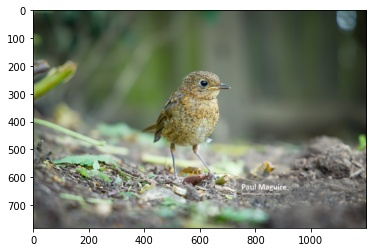

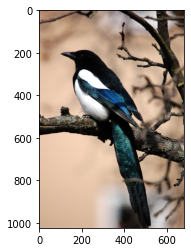

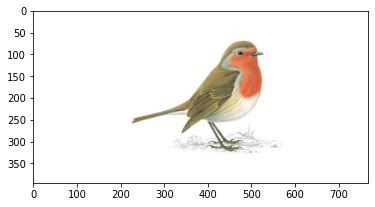

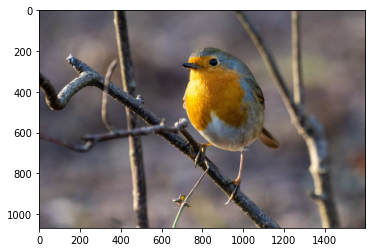

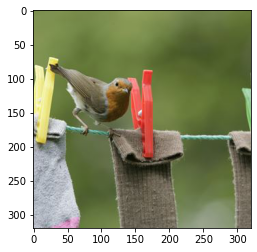

...

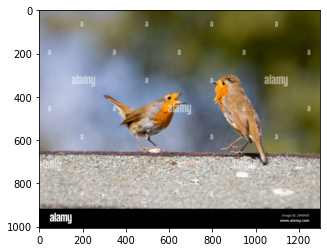

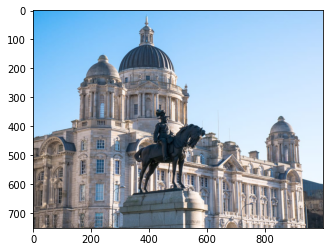

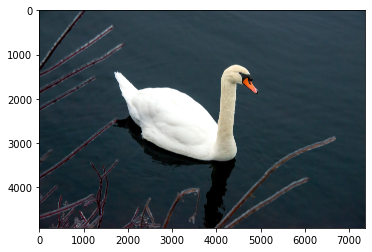

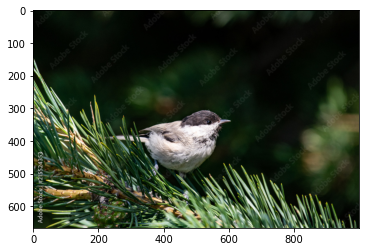

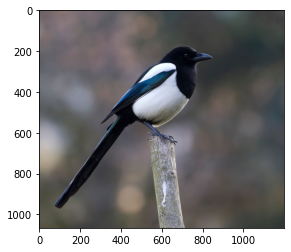

In [16]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
import os
warnings.filterwarnings('ignore')
# Suppress Matplotlib warnings
def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.
    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.
    Args:
    path: the file path to the image
    Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))

for image_path in os.listdir(IMAGE_PATHS):
    image_path = os.path.join(IMAGE_PATHS, image_path)
    print('Running inference for {}... '.format(image_path), end='')
    image_np = load_image_into_numpy_array(image_path)
    # Things to try:
    # Flip horizontally
    # image_np = np.fliplr(image_np).copy()
    # Convert image to grayscale
    # image_np = np.tile()
    # np.mean(image_np, 2, keepdims=True), (1, 1, 3).astype(np.uint8)
        # The input needs to be a tensor, convert it using `tf.convert_to_tensor`
    input_tensor = tf.convert_to_tensor(image_np)
        # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis, ...]
        # input_tensor = np.expand_dims(image_np, 0)
    detections = detect_fn(input_tensor)
        # All outputs are batches tensors.
        # Convert to numpy arrays, and take index [0] to remove the batch dimensi
        # We're only interested in the first num_detections.
    num_detections = int(detections.pop('num_detections'))
    detections = {key: value[0, :num_detections].numpy()
                    for key, value in detections.items()}
    detections['num_detections'] = num_detections
        # detection_classes should be ints./

    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)
    image_np_with_detections = image_np.copy()
    viz_utils.visualize_boxes_and_labels_on_image_array(
        image_np_with_detections,
        detections['detection_boxes'],
        detections['detection_classes'],
        detections['detection_scores'],
        category_index,
        use_normalized_coordinates=True,
        max_boxes_to_draw=200,
        min_score_thresh=0.9,
        agnostic_mode=False)
    plt.figure()
    plt.imshow(image_np_with_detections)
    print('Done')
plt.show()
# sphinx_gallery_thumbnail_number = 2


## **MODEL 4 : FASTER R-CNN Inception ResNet V2 1024x1024**

In [28]:
import matplotlib.pyplot as plt
%matplotlib inline
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2' #supress TF logging 1
import pathlib
import tensorflow as tf
tf.get_logger().setLevel('ERROR') #supress TF logging 2
# Enable GPU dynamic memory allocation
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
IMAGE_PATHS = 'test_images/'

In [29]:
#Model path
PATH_TO_MODEL = "faster_rcnn_inception_resnet_v2_1024x1024_coco17_tpu-8"

In [30]:
PATH_TO_MODEL_DIR = './training/TF2/training/{}/saved_model/saved_model/'.format(PATH_TO_MODEL)

In [31]:
print(PATH_TO_MODEL_DIR)

./training/TF2/training/faster_rcnn_inception_resnet_v2_1024x1024_coco17_tpu-8/saved_model/saved_model/


In [32]:
PATH_TO_LABELS = './data/label_map.pbtxt'

In [33]:
import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
PATH_TO_SAVED_MODEL = PATH_TO_MODEL_DIR
print('Loading model...', end='')
start_time = time.time()
# Load saved model and build the detection function
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)
end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

Loading model...Done! Took 19.647072792053223 seconds


In [34]:
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

Running inference for test_images/g00021.jpg... Done
Running inference for test_images/Pica_pica_-Helsinki,_Finland-8a.jpg... Done
Running inference for test_images/robin_adult_1200x675.jpg... Done
Running inference for test_images/pexels-photo-6771894.jpeg... Done
Running inference for test_images/1016110_robin.jpg... Done
Running inference for test_images/focused_467049850-stock-photo-scotland-coal-tit-periparus-ater.jpg... Done
Running inference for test_images/G4M2-website-robin-2_LR_80ad003c4c6aabee89255151518bb9f9.jpg... Done
Running inference for test_images/file.jpg... Done
Running inference for test_images/1-42.jpg... Done
Running inference for test_images/animal-bird-coal-tit-young.jpg... Done
Running inference for test_images/pexels-petr-ganaj-4168320.jpg... Done
Running inference for test_images/pexels-photo-9249977.jpeg... Done
Running inference for test_images/5a7a88ca4f15a833b877510edfcd0fff.jpg... Done
Running inference for test_images/1000_F_307099660_5R8rStzeL3cvnXSxp

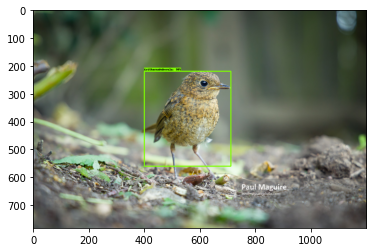

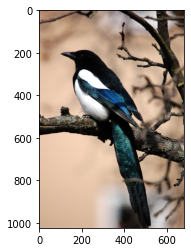

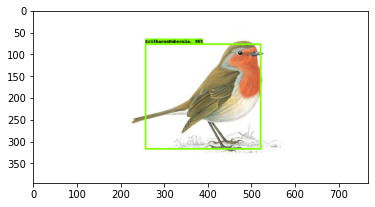

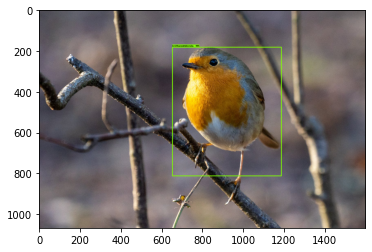

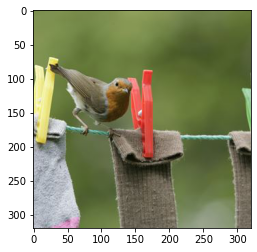

...

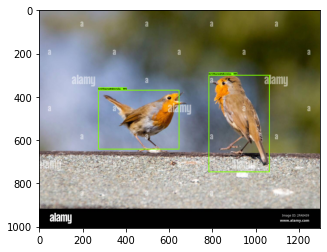

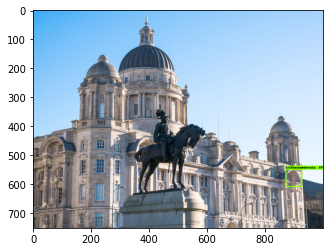

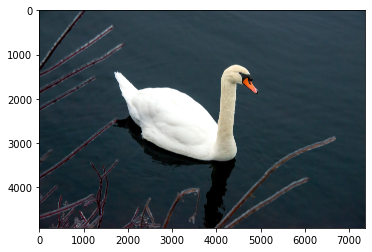

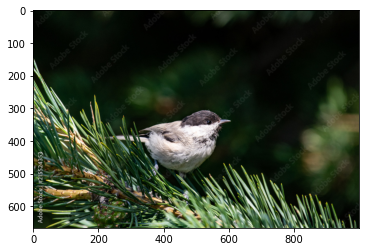

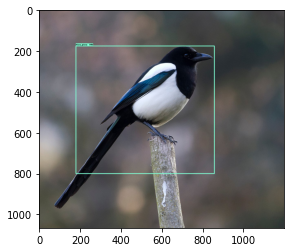

In [35]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
import os
warnings.filterwarnings('ignore')
# Suppress Matplotlib warnings
def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.
    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.
    Args:
    path: the file path to the image
    Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))

for image_path in os.listdir(IMAGE_PATHS):
    image_path = os.path.join(IMAGE_PATHS, image_path)
    print('Running inference for {}... '.format(image_path), end='')
    image_np = load_image_into_numpy_array(image_path)
    # Things to try:
    # Flip horizontally
    # image_np = np.fliplr(image_np).copy()
    # Convert image to grayscale
    # image_np = np.tile()
    # np.mean(image_np, 2, keepdims=True), (1, 1, 3).astype(np.uint8)
        # The input needs to be a tensor, convert it using `tf.convert_to_tensor`
    input_tensor = tf.convert_to_tensor(image_np)
        # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis, ...]
        # input_tensor = np.expand_dims(image_np, 0)
    detections = detect_fn(input_tensor)
        # All outputs are batches tensors.
        # Convert to numpy arrays, and take index [0] to remove the batch dimensi
        # We're only interested in the first num_detections.
    num_detections = int(detections.pop('num_detections'))
    detections = {key: value[0, :num_detections].numpy()
                    for key, value in detections.items()}
    detections['num_detections'] = num_detections
        # detection_classes should be ints./

    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)
    image_np_with_detections = image_np.copy()
    viz_utils.visualize_boxes_and_labels_on_image_array(
        image_np_with_detections,
        detections['detection_boxes'],
        detections['detection_classes'],
        detections['detection_scores'],
        category_index,
        use_normalized_coordinates=True,
        max_boxes_to_draw=200,
        min_score_thresh=0.9,
        agnostic_mode=False)
    plt.figure()
    plt.imshow(image_np_with_detections)
    print('Done')
plt.show()
# sphinx_gallery_thumbnail_number = 2
